In [1]:
import os
import xml.etree.ElementTree as ET
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import onnxruntime
import timm
import shutil
import logging


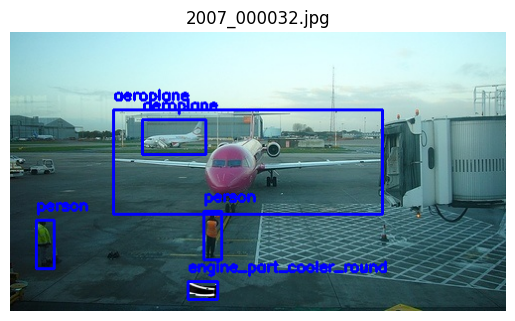

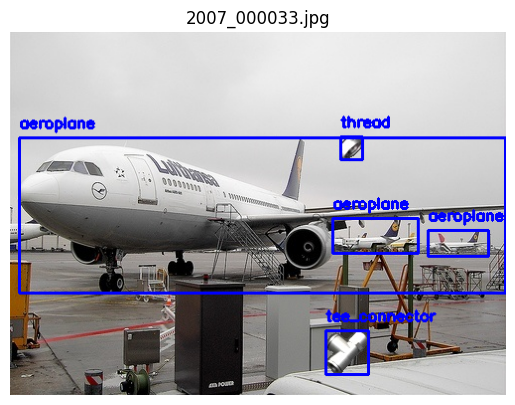

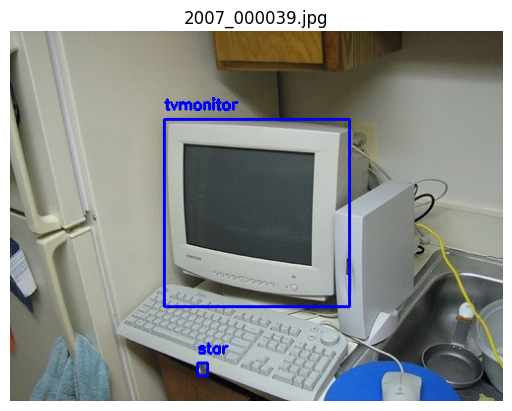

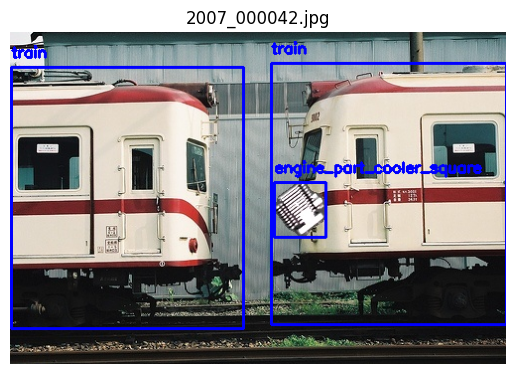

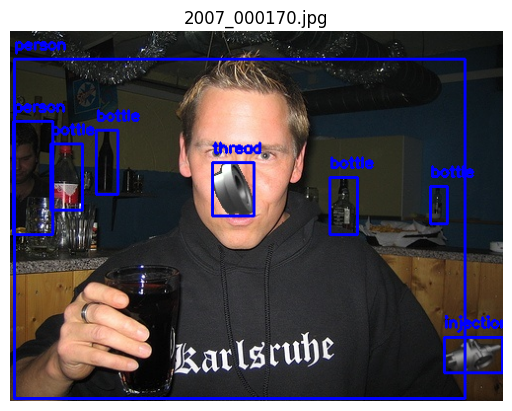

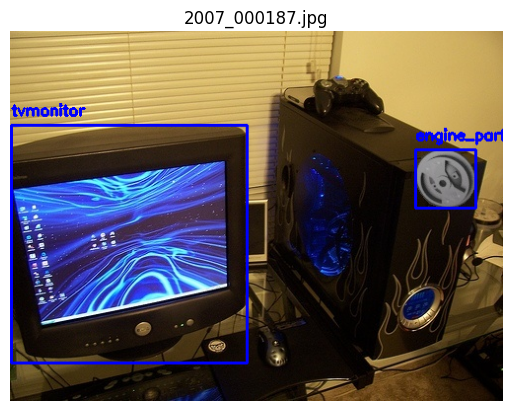

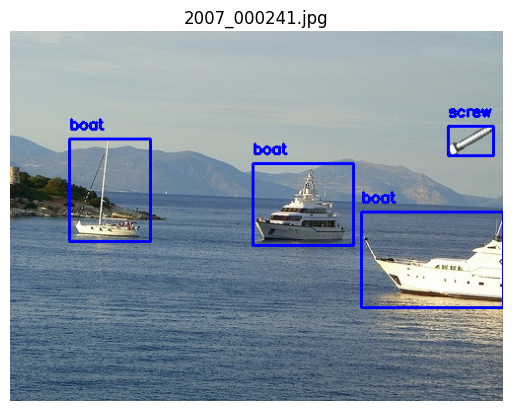

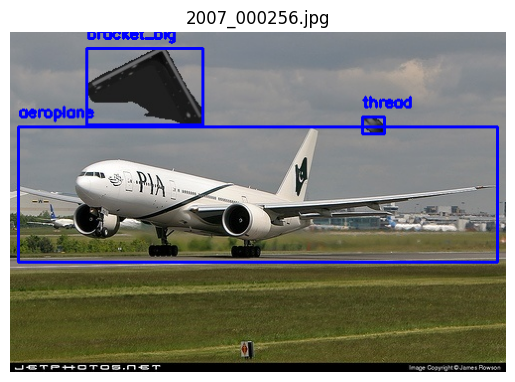

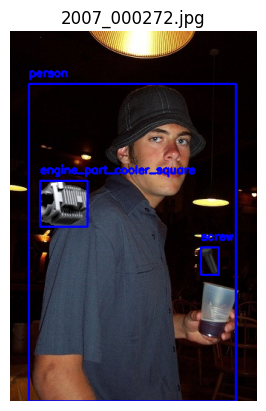

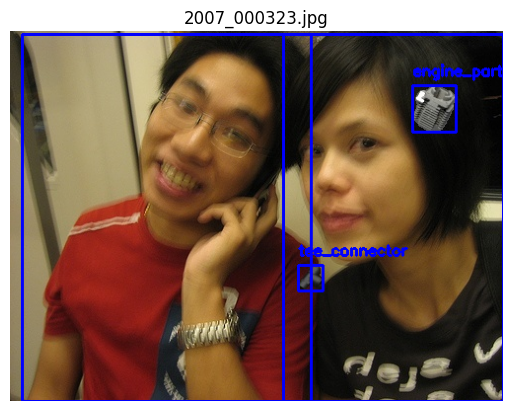

In [2]:
def draw_boxes(image_path, annotations):
    # Загрузить изображение
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    for annotation in annotations:
        # Получить координаты и имя класса из аннотации
        class_name = annotation['name']
        xmin = int(annotation['bndbox']['xmin'])
        ymin = int(annotation['bndbox']['ymin'])
        xmax = int(annotation['bndbox']['xmax'])
        ymax = int(annotation['bndbox']['ymax'])

        # Рисовать рамку
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)  # Красная рамка
        cv2.putText(image, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    return image

def parse_annotations(ann_path):
    annotations = []
    tree = ET.parse(ann_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        class_name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = bndbox.find('xmin').text
        ymin = bndbox.find('ymin').text
        xmax = bndbox.find('xmax').text
        ymax = bndbox.find('ymax').text

        annotations.append({
            'name': class_name,
            'bndbox': {
                'xmin': xmin,
                'ymin': ymin,
                'xmax': xmax,
                'ymax': ymax
            }
        })

    return annotations

def visualize_annotations(image_dir, annotation_dir, num_images=10):
    image_files = os.listdir(image_dir)[:num_images]

    for img_name in image_files:
        if img_name.endswith('.jpg'):  # Убедитесь, что это изображение
            img_path = os.path.join(image_dir, img_name)
            ann_path = os.path.join(annotation_dir, img_name.replace('.jpg', '.xml'))

            # Загрузить аннотации
            if os.path.exists(ann_path):
                annotations = parse_annotations(ann_path)

                # Нарисовать рамки на изображении
                annotated_image = draw_boxes(img_path, annotations)

                # Отобразить изображение
                plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.title(img_name)
                plt.show()
                plt.close()  # Закрыть текущую фигуру

# Задайте пути к директориям
image_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\OutputImages"
annotation_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\OutputAnnotations"

# Вызов функции для визуализации аннотаций
visualize_annotations(image_dir, annotation_dir, num_images=10)

In [3]:
# Настройка логирования
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

class_mapping = {
    'aeroplane': 0, 'bicycle': 1, 'bird': 2, 'boat': 3,
    'bottle': 4, 'bus': 5, 'car': 6, 'cat': 7,
    'chair': 8, 'cow': 9, 'diningtable': 10, 'dog': 11,
    'horse': 12, 'motorbike': 13, 'person': 14, 'pottedplant': 15,
    'sheep': 16, 'sofa': 17, 'train': 18, 'tvmonitor': 19,
    'adapter_plate_triangular': 20, 'bracket_big': 21, 'clamp_small': 22, 
    'engine_part_cooler_round': 23, 'engine_part_cooler_square': 24, 
    'injection_pump': 25, 'screw': 26, 'star': 27, 'tee_connector': 28, 
    'thread': 29
}

def get_class_index(class_name):
    return class_mapping.get(class_name, -1)

def stretch_resize_image(image, target_size):
    h, w = image.shape[:2]
    
    # Масштабируем по меньшей стороне до target_size
    scale_min = target_size / min(h, w)
    new_w = int(w * scale_min)
    new_h = int(h * scale_min)
    resized = cv2.resize(image, (new_w, new_h))
    
    # Растягиваем по большей стороне до target_size
    if new_w != target_size or new_h != target_size:
        stretched = cv2.resize(resized, (target_size, target_size))
    else:
        stretched = resized
    
    # Возвращаем изображение и коэффициенты масштабирования по осям
    scale_x = target_size / w
    scale_y = target_size / h
    
    return stretched, scale_x, scale_y

def parse_annotations(xml_file, img_width, img_height):
    try:  
        tree = ET.parse(xml_file)
        root = tree.getroot()
        annotations = []
    
        for obj in root.findall('object'):
            name = obj.find('name').text
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
        
            # Преобразуем координаты в формат YOLO(нормализация)
            x_center = ((xmin + xmax) / 2) / img_width
            y_center = ((ymin + ymax) / 2) / img_height
            width = (xmax - xmin) / img_width
            height = (ymax - ymin) / img_height
        
            # Получаем индекс класса
            class_index = get_class_index(name)
        
            if class_index >= 0:  # Проверяем, что индекс класса валиден
                annotations.append((class_index, x_center, y_center, width, height)) 
    
        return annotations
    except Exception as e:
        logging.error(f"Ошибка при парсинге аннотации {xml_file}: {e}")
        return []


In [4]:
def prepare_yolo_data_stretch(image_dir, annotation_dir, output_dir, target_size=640, max_samples=None):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    images = os.listdir(image_dir)
    if max_samples is not None:
        images = images[:max_samples]

    for img_name in images:
        if img_name.endswith('.jpg'):
            xml_file = os.path.join(annotation_dir, img_name.replace('.jpg', '.xml'))
            image_file = os.path.join(image_dir, img_name)
            if os.path.exists(image_file) and os.path.exists(xml_file):
                try:
                    image = cv2.imread(image_file)
                    stretched_image, scale_x, scale_y = stretch_resize_image(image, target_size)
                    cv2.imwrite(os.path.join(output_dir, img_name), stretched_image)

                    annotations = parse_annotations(xml_file, image.shape[1], image.shape[0])
                    updated_annotations = []
                    for class_index, x_center, y_center, width, height in annotations:
                        # Координаты bbox в пикселях по исходному изображению
                        orig_xc = x_center
                        orig_yc = y_center
                        orig_w = width
                        orig_h = height

                        # Переводим из формата YOLO (нормализованного) в пиксели исходного изображения
                        px_xc = orig_xc * image.shape[1]
                        px_yc = orig_yc * image.shape[0]
                        px_w = orig_w * image.shape[1]
                        px_h = orig_h * image.shape[0]

                        # Масштабируем bbox по осям отдельно
                        new_xc = px_xc * scale_x
                        new_yc = px_yc * scale_y
                        new_w = px_w * scale_x
                        new_h = px_h * scale_y

                        # Нормализуем bbox относительно target_size
                        new_xc_norm = new_xc / target_size
                        new_yc_norm = new_yc / target_size
                        new_w_norm = new_w / target_size
                        new_h_norm = new_h / target_size

                        # Ограничиваем значения [0,1]
                        new_xc_norm = max(0, min(1, new_xc_norm))
                        new_yc_norm = max(0, min(1, new_yc_norm))
                        new_w_norm = max(0, min(1, new_w_norm))
                        new_h_norm = max(0, min(1, new_h_norm))

                        updated_annotations.append(f"{class_index} {new_xc_norm} {new_yc_norm} {new_w_norm} {new_h_norm}")

                    txt_file = os.path.join(output_dir, img_name.replace('.jpg', '.txt'))
                    with open(txt_file, 'w') as f:
                        for annotation in updated_annotations:
                            f.write(annotation + '\n')

                except Exception as e:
                    logging.error(f"Ошибка при обработке {img_name}: {e}")

In [5]:
# Параметры для данных
train_image_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\OutputImages"
train_annotation_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\OutputAnnotations"
train_output_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations"

test_image_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\OutputImages"
test_annotation_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\OutputAnnotations"
test_output_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations"

# Подготовка данных
prepare_yolo_data_stretch(train_image_dir, train_annotation_dir, train_output_dir, max_samples=4000)
prepare_yolo_data_stretch(test_image_dir, test_annotation_dir, test_output_dir, max_samples=2000)



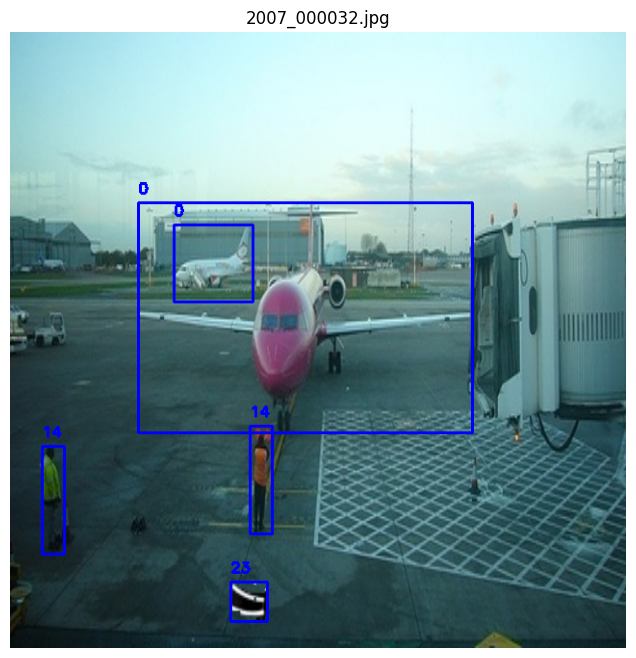

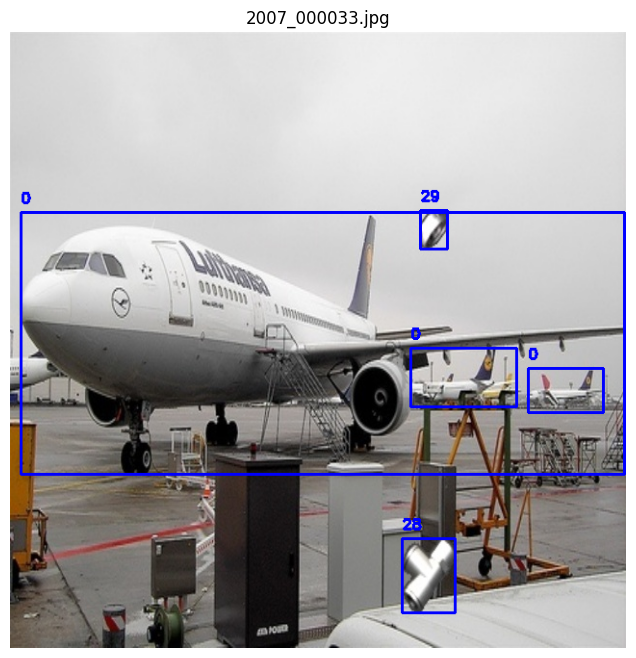

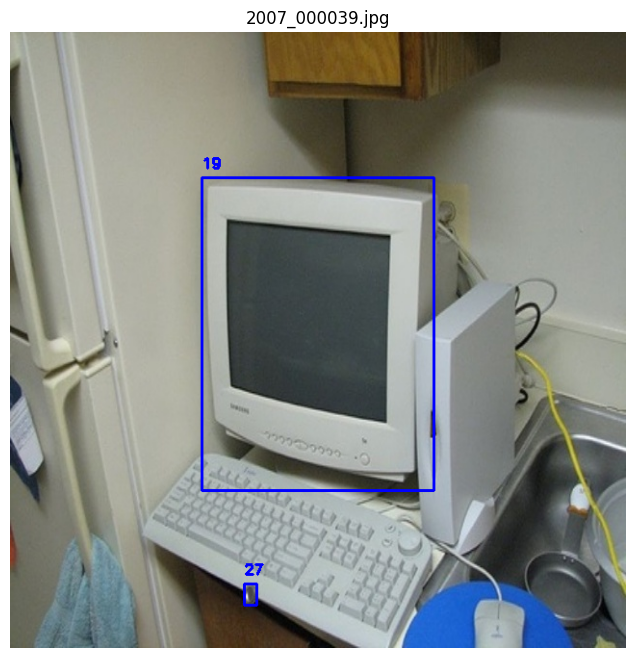

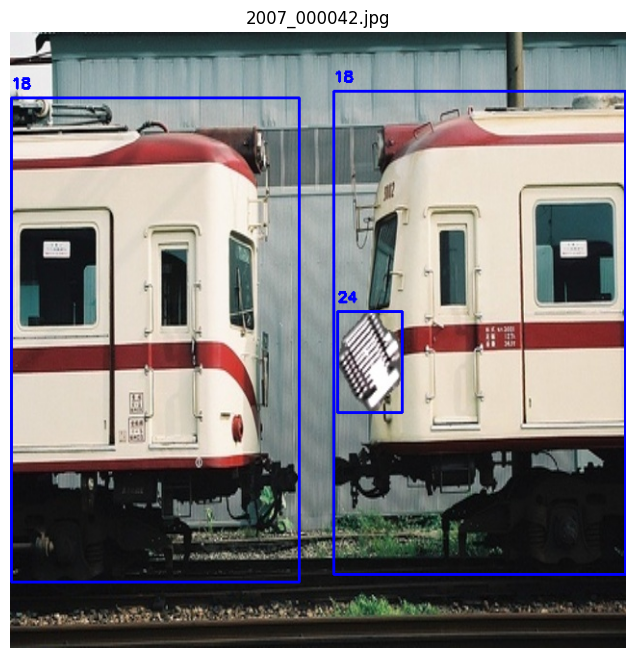

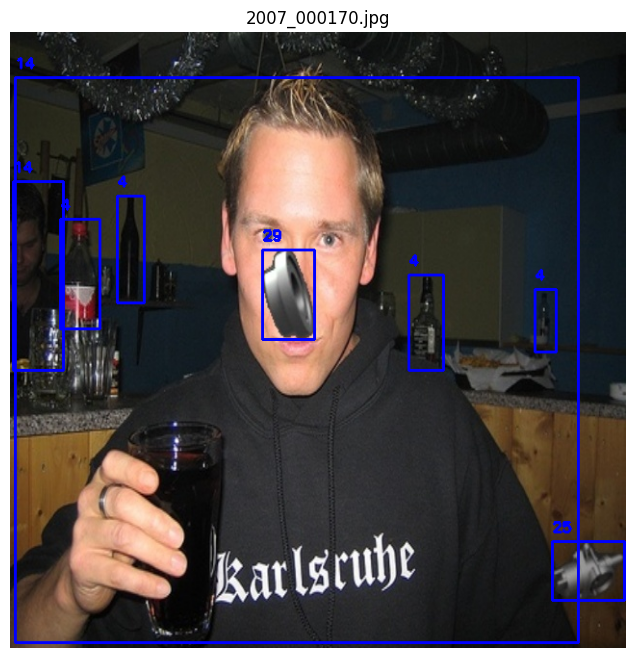

...

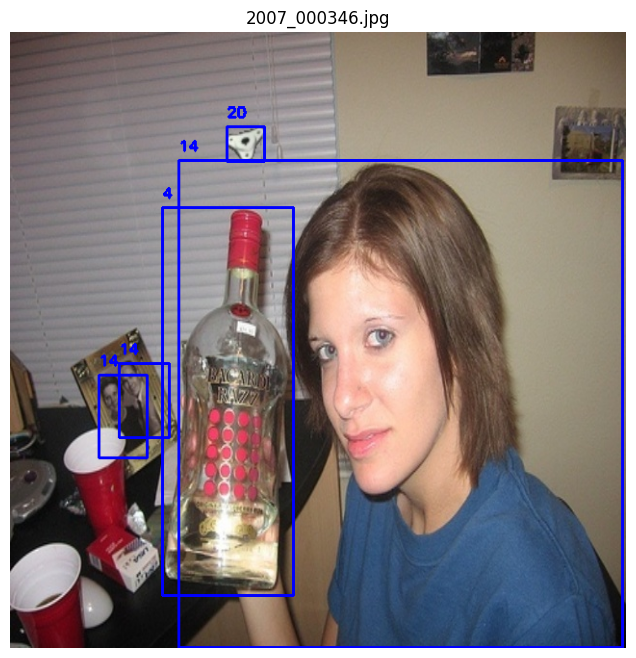

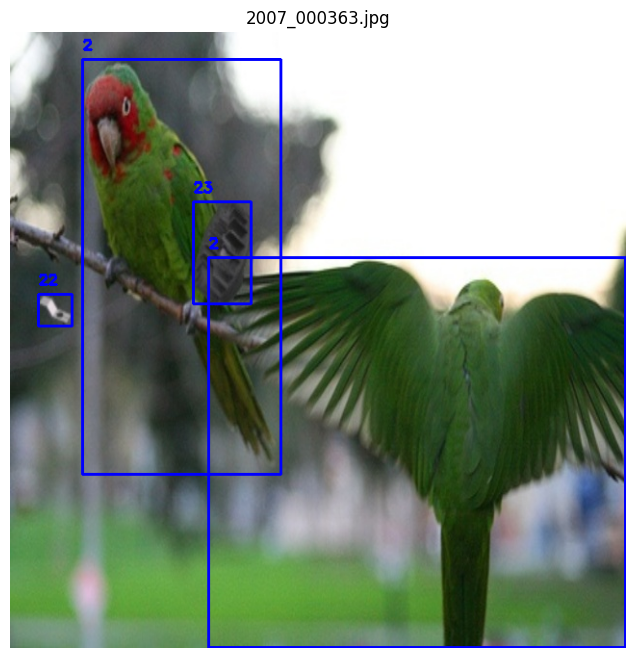

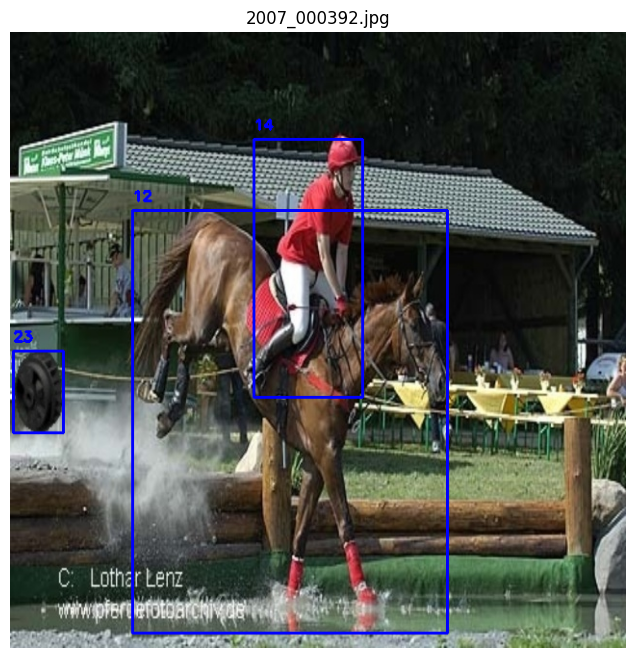

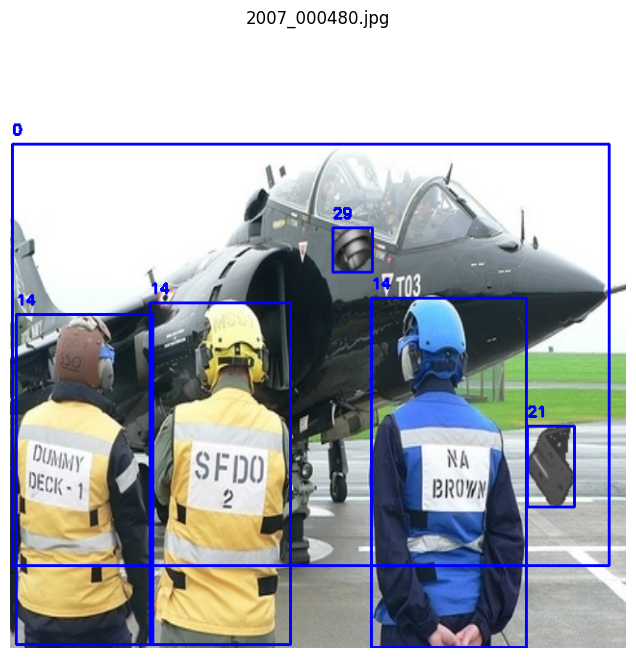

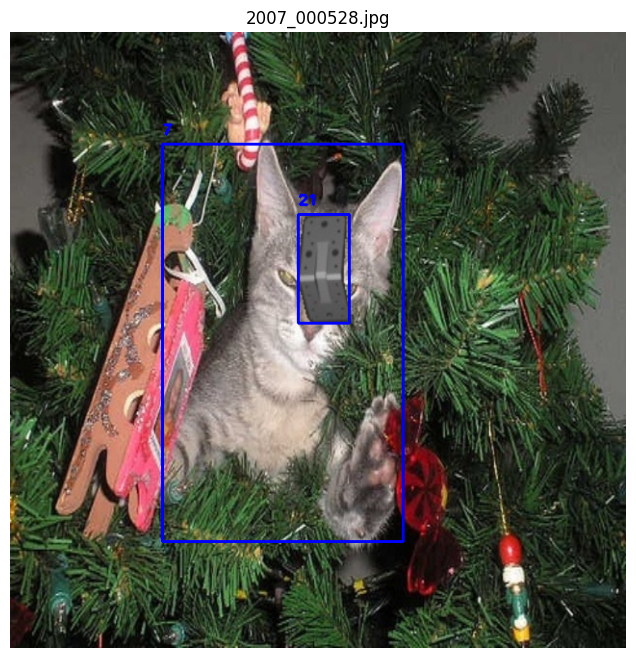

In [65]:
def draw_boxes(image_path, annotations):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    for annotation in annotations:
        parts = annotation.strip().split()
        if len(parts) != 5:
            continue  # пропускаем некорректные строки
    
        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        box_width = float(parts[3])
        box_height = float(parts[4])

        # Перевод нормализованных координат в пиксели
        xmin = int((x_center - box_width / 2) * width)
        ymin = int((y_center - box_height / 2) * height)
        xmax = int((x_center + box_width / 2) * width)
        ymax = int((y_center + box_height / 2) * height)

        # Клипинг по границам изображения (чтобы не выходить)
        xmin = max(0, xmin)
        ymin = max(0, ymin)
        xmax = min(width - 1, xmax)
        ymax = min(height - 1, ymax)

        # Нарисовать прямоугольник (синий цвет в BGR)
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color=(255, 0, 0), thickness=2)
        # Подпись — номер класса
        cv2.putText(image, str(class_id), (xmin, max(ymin - 10, 0)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    return image

def visualize_annotations(image_dir, annotation_dir, num_images=10):
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')][:num_images]

    for img_name in image_files:
        img_path = os.path.join(image_dir, img_name)
        ann_path = os.path.join(annotation_dir, img_name.replace('.jpg', '.txt'))

        if os.path.exists(ann_path):
            with open(ann_path, 'r') as f:
                annotations = f.readlines()

            annotated_image = draw_boxes(img_path, annotations)

            plt.figure(figsize=(8,8))
            plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.title(img_name)
            plt.show()
            plt.close()

# Параметры для данных
train_image_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations"
train_annotation_dir = r"C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations"

# Визуализация аннотаций
visualize_annotations(train_image_dir, train_annotation_dir, num_images=16)


In [66]:
data_yaml = """train: C:/Users/User/Desktop/Deep Learning/New_Dataset_for_YOLO/train/YOLO_Annotations
val: C:/Users/User/Desktop/Deep Learning/New_Dataset_for_YOLO/test/YOLO_Annotations

nc: 30  # Количество классов
names: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor', 'adapter_plate_triangular',
    'bracket_big', 'clamp_small', 'engine_part_cooler_round', 'engine_part_cooler_square', 'injection_pump',
    'screw', 'star', 'tee_connector', 'thread']
"""

with open('data.yaml', 'w') as f:
    f.write(data_yaml)
    

In [3]:
import random

test_image_dir_YOLO = r'C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations'

# Загрузка и обучение модели
# model = YOLO('yolov8s.pt')
model = YOLO('best_model.pt')
model.export(format='onnx')

class_names = model.names
best_epoch_save_dir = r'C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\best_epoch_images3'
best_epoch_save_dir_visualize_exemple = r'C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\best_epoch_images3\epoch'
os.makedirs(best_epoch_save_dir, exist_ok=True)
os.makedirs(best_epoch_save_dir_visualize_exemple, exist_ok=True)

def get_image_files(dir_path, exts=('.jpg', '.jpeg', '.png')):
    return [f for f in os.listdir(dir_path) if f.lower().endswith(exts)]

def visualize_epoch_predictions(model, image_dir, class_names, num_images=10, save_dir=None, epoch=None):
    image_files = get_image_files(image_dir)
    images = random.sample(image_files, min(num_images, len(image_files)))

    # Если указана папка для сохранения и номер эпохи — формируем путь с учетом эпохи
    if save_dir and epoch is not None:
        epoch_save_dir = os.path.join(save_dir, f'epoch_{epoch}')
        os.makedirs(epoch_save_dir, exist_ok=True)
    elif save_dir:
        os.makedirs(save_dir, exist_ok=True)

    for img_name in images:
        img_path = os.path.join(image_dir, img_name)
        results = model.predict(img_path, imgsz=640, conf=0.25)
        annotated_img = results[0].plot()

        if save_dir:
            # Сохраняем в папку с номером эпохи, если она есть
            if epoch is not None:
                save_path = os.path.join(epoch_save_dir, img_name)
            else:
                save_path = os.path.join(save_dir, img_name)
            cv2.imwrite(save_path, annotated_img)
        else:
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
            plt.title(img_name)
            plt.axis('off')
            plt.show()

def save_preds_with_boxes(model, image_dir, save_dir, class_names, num_images=10):
    os.makedirs(save_dir, exist_ok=True)
    image_files = get_image_files(image_dir)
    images = random.sample(image_files, min(num_images, len(image_files)))
    for img_name in images:
        img_path = os.path.join(image_dir, img_name)
        results = model.predict(img_path, imgsz=640, conf=0.25)
        annotated_img = results[0].plot()

        save_path = os.path.join(save_dir, img_name)
        cv2.imwrite(save_path, annotated_img)

# История метрик
train_box_loss_history = []
train_cls_loss_history = []
train_dfl_loss_history = []

train_precision_history = []
train_recall_history = []
train_map50_history = []
train_map5095_history = []
train_f1_history = []

best_map50 = 0

# Запускаем обучение на 10 эпох
for epoch in range(10):
    print(f"Epoch {epoch + 1}/10")
    results = model.train(
    data='data.yaml', 
    epochs=1, 
    imgsz=640, 
    lr0=0.005,
    project=r'C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization',  # корневая директория
    name='train_results',  # имя эксперимента/папки с результатами
    exist_ok=True  # чтобы перезаписывать
)
    if hasattr(results, 'history') and len(results.history) > 0:
        last_epoch_loss = results.history[-1]
        train_box_loss_history.append(last_epoch_loss.get('box_loss', None))
        train_cls_loss_history.append(last_epoch_loss.get('cls_loss', None))
        train_dfl_loss_history.append(last_epoch_loss.get('dfl_loss', None))
    else:
        train_box_loss_history.append(None)
        train_cls_loss_history.append(None)
        train_dfl_loss_history.append(None)

    precision = getattr(results.box, 'precision', 0)
    recall = getattr(results.box, 'recall', 0)
    map50 = getattr(results.box, 'map50', 0) or getattr(results.box, 'mAP50', 0)
    map5095 = getattr(results.box, 'map50_95', 0) or getattr(results.box, 'mAP50_95', 0)
    f1 = getattr(results.box, 'f1', 0)

    train_precision_history.append(precision)
    train_recall_history.append(recall)
    train_map50_history.append(map50)
    train_map5095_history.append(map5095)
    train_f1_history.append(f1)

    if map50 > best_map50:
        best_map50 = map50
        model.save('best_model.pt')

    # Сохраняем изображения с предсказаниями в папку с номером эпохи
    visualize_epoch_predictions(
        model,
        test_image_dir_YOLO,
        class_names,
        num_images=15,
        save_dir=best_epoch_save_dir_visualize_exemple,
        epoch=epoch + 1
    )

    # Сохраняем примеры с рамками
    save_preds_with_boxes(model, test_image_dir_YOLO, best_epoch_save_dir, class_names, num_images=150)

# Инференс с использованием ONNX Runtime
def run_inference_onnx(model_path, image):
    session = onnxruntime.InferenceSession(model_path, providers=['DmlExecutionProvider', 'CPUExecutionProvider'])
    input_name = session.get_inputs()[0].name
    output_names = [output.name for output in session.get_outputs()]
    
    # Подготовка изображения
    img = cv2.imread(image)
    img_resized = cv2.resize(img, (640, 640))  # Измените размеры в соответствии с вашей моделью
    img_normalized = img_resized.astype(np.float32) / 255.0  # Нормализация
    img_input = img_normalized.transpose(2, 0, 1)  # Изменение порядка на (C, H, W)
    img_input = np.expand_dims(img_input, axis=0)  # Добавление размерности для батча

    # Выполнение инференса
    outputs = session.run(output_names, {input_name: img_input})
    return outputs
    
# Построение графиков по метрикам
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.plot(train_box_loss_history, label='Box Loss')
plt.plot(train_cls_loss_history, label='Cls Loss')
plt.plot(train_dfl_loss_history, label='DFL Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(train_precision_history, label='Precision')
plt.plot(train_recall_history, label='Recall')
plt.title('Precision and Recall over Epochs')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(train_map50_history, label='mAP50')
plt.plot(train_map5095_history, label='mAP50-95')
plt.title('mAP over Epochs')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(train_f1_history, label='F1 Score')
plt.title('F1 Score over Epochs')
plt.xlabel('Epoch')
plt.legend()

plt.tight_layout()
plt.show()



Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs

PyTorch: starting from 'best_model.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 34, 8400) (21.5 MB)
requirements: Ultralytics requirement ['onnxruntime'] not found, attempting AutoUpdate...
WARNING Retry 1/2 failed: Command 'pip install --no-cache-dir "onnxruntime" ' returned non-zero exit status 1.
WARNING Retry 2/2 failed: Command 'pip install --no-cache-dir "onnxruntime" ' returned non-zero exit status 1.
WARNING requirements:  Command 'pip install --no-cache-dir "onnxruntime" ' returned non-zero exit status 1.

ONNX: starting export with onnx 1.18.0 opset 19...
ONNX: slimming with onnxslim 0.1.52...
ONNX: export success  42.7s, saved as 'best_model.onnx' (42.7 MB)

Export complete (43.2s)
Results saved to C:\Users\User\Desktop\Deep Learning
Predict:         yolo predict task=detect model=best_

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.20.1 ms, read: 145.340.2 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.5453     0.6503      1.017        126        640: 100%|██████████| 250/250 [28:35<00:00,  6.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:37<00:00,  5.36s/it]


                   all       2000       5942      0.586      0.561      0.581      0.508

1 epochs completed in 0.572 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:58<00:00,  4.74s/it]


                   all       2000       5942      0.587      0.561      0.581      0.508
                 chair          1          2          0          0   0.000261   7.83e-05
           diningtable          2          2          0          0     0.0062    0.00474
                person       2000       2934      0.456      0.792      0.482      0.304
adapter_plate_triangular        330        340      0.683      0.589      0.669      0.582
           bracket_big        349        364      0.831      0.823      0.886      0.791
           clamp_small         77         78      0.406      0.123      0.173      0.148
engine_part_cooler_round        417        430      0.818      0.786      0.852      0.804
engine_part_cooler_square        443        472      0.727       0.82      0.839      0.783
        injection_pump        434        465      0.732      0.778      0.815      0.736
                 screw        154        155      0.754      0.658      0.703       0.57
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 455.9162.0 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.5254     0.6271      1.007        126        640: 100%|██████████| 250/250 [28:34<00:00,  6.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:46<00:00,  5.50s/it]


                   all       2000       5942      0.559      0.583      0.559      0.488

1 epochs completed in 0.574 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:58<00:00,  4.73s/it]


                   all       2000       5942      0.561      0.583       0.56      0.488
                 chair          1          2          0          0   4.62e-05   1.39e-05
           diningtable          2          2     0.0161        0.5     0.0207     0.0113
                person       2000       2934      0.354      0.821      0.383      0.225
adapter_plate_triangular        330        340      0.712      0.503      0.614      0.533
           bracket_big        349        364       0.85      0.805      0.876      0.767
           clamp_small         77         78      0.376      0.103      0.171      0.151
engine_part_cooler_round        417        430       0.82       0.74       0.83      0.787
engine_part_cooler_square        443        472       0.71      0.814      0.833      0.779
        injection_pump        434        465      0.596      0.845      0.818      0.724
                 screw        154        155      0.659      0.652      0.676      0.555
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 468.3154.4 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.5112     0.5981      0.998        126        640: 100%|██████████| 250/250 [27:50<00:00,  6.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:35<00:00,  5.32s/it]


                   all       2000       5942      0.595      0.567      0.573      0.491

1 epochs completed in 0.558 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:58<00:00,  4.74s/it]


                   all       2000       5942      0.592       0.57      0.573      0.492
                 chair          1          2          0          0   4.92e-05   2.46e-05
           diningtable          2          2      0.025        0.5     0.0196     0.0154
                person       2000       2934      0.418      0.826      0.452      0.266
adapter_plate_triangular        330        340      0.761      0.494      0.647      0.555
           bracket_big        349        364      0.819      0.819       0.88      0.761
           clamp_small         77         78      0.346     0.0897      0.149      0.125
engine_part_cooler_round        417        430      0.884      0.672      0.837      0.779
engine_part_cooler_square        443        472      0.768      0.788      0.847      0.783
        injection_pump        434        465      0.652      0.837      0.837      0.724
                 screw        154        155      0.762      0.641      0.695      0.555
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 463.9165.2 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4947     0.5705     0.9886        126        640: 100%|██████████| 250/250 [28:20<00:00,  6.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:37<00:00,  5.35s/it]


                   all       2000       5942      0.598      0.603      0.601      0.518

1 epochs completed in 0.567 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:00<00:00,  4.76s/it]


                   all       2000       5942      0.597      0.602      0.601      0.518
                 chair          1          2          0          0    0.00014   4.19e-05
           diningtable          2          2     0.0133        0.5     0.0154     0.0123
                person       2000       2934      0.461      0.853      0.579      0.353
adapter_plate_triangular        330        340      0.794       0.51       0.69      0.597
           bracket_big        349        364      0.776      0.876      0.904        0.8
           clamp_small         77         78      0.408      0.141      0.178      0.147
engine_part_cooler_round        417        430      0.841      0.787      0.871      0.819
engine_part_cooler_square        443        472       0.76      0.843      0.873      0.812
        injection_pump        434        465      0.733      0.811      0.852      0.744
                 screw        154        155      0.829      0.619      0.701      0.558
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 506.2189.4 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4786     0.5461     0.9801        126        640: 100%|██████████| 250/250 [28:06<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:36<00:00,  5.33s/it]


                   all       2000       5942      0.617      0.604      0.607      0.527

1 epochs completed in 0.563 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:00<00:00,  4.77s/it]


                   all       2000       5942      0.617      0.606      0.606      0.527
                 chair          1          2          0          0   0.000308   3.08e-05
           diningtable          2          2     0.0159        0.5    0.00962    0.00776
                person       2000       2934      0.502      0.863      0.602      0.381
adapter_plate_triangular        330        340       0.84      0.463      0.683      0.597
           bracket_big        349        364       0.86       0.83      0.898      0.803
           clamp_small         77         78      0.482      0.179        0.2       0.17
engine_part_cooler_round        417        430      0.798      0.835      0.871      0.821
engine_part_cooler_square        443        472      0.807      0.831      0.871      0.816
        injection_pump        434        465      0.802      0.753       0.85      0.754
                 screw        154        155      0.816      0.568      0.708      0.571
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 493.1151.8 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4602     0.5235     0.9703        126        640: 100%|██████████| 250/250 [28:46<00:00,  6.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:33<00:00,  5.29s/it]


                   all       2000       5942      0.618        0.6      0.596       0.52

1 epochs completed in 0.573 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:58<00:00,  4.74s/it]


                   all       2000       5942      0.616      0.601      0.596       0.52
                 chair          1          2          0          0   0.000113   3.39e-05
           diningtable          2          2     0.0131        0.5     0.0113    0.00759
                person       2000       2934      0.498      0.823      0.536      0.331
adapter_plate_triangular        330        340      0.836       0.51      0.685        0.6
           bracket_big        349        364      0.874      0.842      0.904      0.813
           clamp_small         77         78      0.354      0.154      0.165      0.139
engine_part_cooler_round        417        430      0.849      0.802      0.869      0.818
engine_part_cooler_square        443        472      0.825      0.809      0.864      0.805
        injection_pump        434        465      0.798      0.766      0.848      0.762
                 screw        154        155      0.882       0.58       0.72      0.581
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 489.9164.3 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4496     0.5037     0.9632        126        640: 100%|██████████| 250/250 [28:23<00:00,  6.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:29<00:00,  5.23s/it]


                   all       2000       5942      0.609      0.586      0.582      0.502

1 epochs completed in 0.566 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:57<00:00,  4.72s/it]


                   all       2000       5942       0.61      0.586      0.583      0.502
                 chair          1          2          0          0   0.000259   5.17e-05
           diningtable          2          2     0.0265        0.5     0.0144     0.0113
                person       2000       2934      0.495      0.807      0.493      0.301
adapter_plate_triangular        330        340       0.82      0.468      0.652      0.561
           bracket_big        349        364      0.885      0.827      0.894      0.794
           clamp_small         77         78      0.327      0.115      0.171      0.141
engine_part_cooler_round        417        430      0.869      0.733      0.846      0.785
engine_part_cooler_square        443        472      0.827      0.799      0.858      0.794
        injection_pump        434        465      0.735      0.812      0.838      0.742
                 screw        154        155      0.762      0.632      0.712      0.569
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 453.9166.6 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      0.439     0.4859     0.9565        126        640: 100%|██████████| 250/250 [28:22<00:00,  6.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:34<00:00,  5.30s/it]


                   all       2000       5942      0.595       0.56      0.568      0.491

1 epochs completed in 0.567 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:55<00:00,  4.69s/it]


                   all       2000       5942      0.591      0.561      0.568      0.491
                 chair          1          2          0          0   0.000196   5.87e-05
           diningtable          2          2     0.0171        0.5      0.013     0.0117
                person       2000       2934        0.5      0.784       0.49      0.298
adapter_plate_triangular        330        340      0.896      0.406       0.63      0.543
           bracket_big        349        364       0.85      0.827      0.884      0.777
           clamp_small         77         78      0.248     0.0803      0.134       0.11
engine_part_cooler_round        417        430       0.85      0.733      0.836      0.783
engine_part_cooler_square        443        472      0.834      0.788      0.856      0.798
        injection_pump        434        465        0.7      0.796      0.825      0.733
                 screw        154        155      0.706      0.604      0.695      0.562
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 451.3106.0 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4222     0.4648     0.9488        126        640: 100%|██████████| 250/250 [28:38<00:00,  6.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:34<00:00,  5.30s/it]


                   all       2000       5942      0.583      0.586      0.578      0.507

1 epochs completed in 0.571 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:55<00:00,  4.70s/it]


                   all       2000       5942      0.583      0.587      0.577      0.507
                 chair          1          2          0          0   0.000381   3.81e-05
           diningtable          2          2     0.0196        0.5     0.0227     0.0205
                person       2000       2934      0.503      0.858      0.551      0.346
adapter_plate_triangular        330        340      0.822      0.434      0.635      0.556
           bracket_big        349        364      0.794      0.846      0.879      0.798
           clamp_small         77         78      0.336     0.0843      0.147      0.129
engine_part_cooler_round        417        430      0.817      0.788      0.855      0.808
engine_part_cooler_square        443        472       0.77      0.826      0.864      0.817
        injection_pump        434        465      0.718      0.822      0.834      0.741
                 screw        154        155      0.707      0.626      0.688      0.565
              

train: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\train\YOLO_Annotations.cache... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 463.6161.1 MB/s, size: 139.2 KB)



val: Scanning C:\Users\User\Desktop\Deep Learning\New_Dataset_for_YOLO\test\YOLO_Annotations.cache... 2000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2000/2000 [00:00<?, ?it/s]

Plotting labels to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000294, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G     0.4078     0.4472     0.9422        126        640: 100%|██████████| 250/250 [28:08<00:00,  6.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [05:23<00:00,  5.13s/it]


                   all       2000       5942      0.585       0.54      0.574      0.502

1 epochs completed in 0.560 hours.
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\last.pt, 22.5MB
Optimizer stripped from C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt, 22.5MB

Validating C:\Users\User\Desktop\Deep Learning\SaveYOLOLocalization\train_results\weights\best.pt...
Ultralytics 8.3.130  Python-3.12.4 torch-2.7.0+cpu CPU (Intel Xeon E5-2680 v4 2.40GHz)
Model summary (fused): 72 layers, 11,137,194 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [04:53<00:00,  4.66s/it]


                   all       2000       5942      0.582      0.541      0.575      0.502
                 chair          1          2          0          0   0.000376   3.76e-05
           diningtable          2          2          0          0    0.00535    0.00371
                person       2000       2934      0.495      0.808      0.547      0.345
adapter_plate_triangular        330        340      0.842      0.406      0.635       0.56
           bracket_big        349        364      0.803      0.849       0.89      0.802
           clamp_small         77         78       0.34     0.0897      0.125      0.108
engine_part_cooler_round        417        430       0.81      0.781      0.856      0.811
engine_part_cooler_square        443        472      0.735      0.856      0.859      0.808
        injection_pump        434        465       0.69      0.815      0.828      0.735
                 screw        154        155       0.69        0.6      0.684      0.551
              

<Figure size 1500x1000 with 4 Axes>